<a href="https://colab.research.google.com/github/Shrey-Viradiya/DiveDeep/blob/master/LPW_implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LPW implementation
### 18BCE259

## GAN for CIFAR 10

In [1]:
!nvidia-smi

Mon May 10 10:29:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   70C    P0    36W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Importing Libraries

In [2]:
import tensorflow as tf
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt

## Getting Data

In [3]:
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()
train_images = train_images.astype(np.float32) / 255.
test_images = test_images.astype(np.float32) / 255.

In [4]:
train_images = train_images[(train_labels == 1).reshape((-1,))]

In [5]:
(train_labels == 1).reshape((-1,)).shape

(50000,)

In [6]:
train_images.shape

(5000, 32, 32, 3)

## Plotting Data

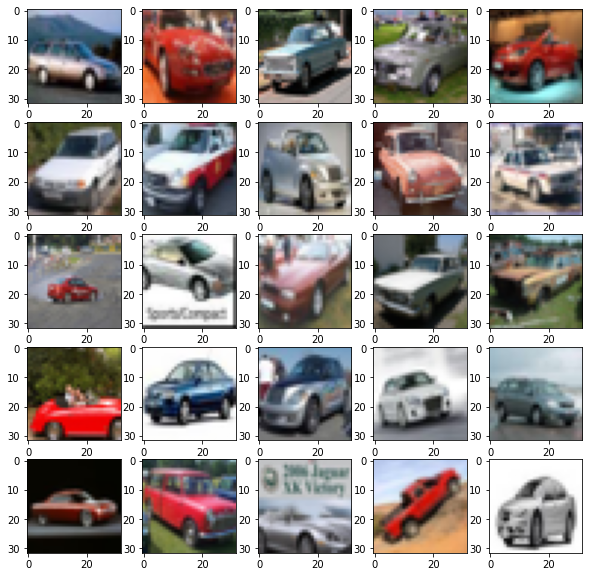

In [7]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.grid(False)
    plt.imshow(train_images[i].squeeze())
plt.show()

## Discriminator Builder

In [8]:
def discriminator_builder(img_w, img_h,width = 64, p = 0.4):
    # define inputs    
    inputs = keras.layers.Input((img_w, img_h,3))
    
    # convolutional layers
    conv1 = keras.layers.Conv2D(width* 1, 5, strides=2, padding='same', activation='relu')(inputs)
    conv1 = keras.layers.Dropout(p)(conv1)
    
    conv2 = keras.layers.Conv2D(width  *2, 5, strides=2,    padding='same', activation='relu')(conv1)
    conv2 = keras.layers.Dropout(p)(conv2)
    
    conv3 = keras.layers.Conv2D(width *4, 5, strides=2,  padding='same', activation='relu')(conv2)
    conv3 = keras.layers.Dropout(p)(conv3)
    
    conv4 = keras.layers.Conv2D(width*8, 5,  strides=1, padding='same', activation='relu')(conv3)
    conv4 = keras.layers.Flatten()(keras.layers.Dropout(p)(conv4))
    
    output = keras.layers.Dense(1, activation='sigmoid')(conv4)
    
    # Model definition
    model = keras.models.Model(inputs=inputs, outputs=output)
    model.summary()
    
    return model

## Generator Builder

In [9]:
def generator_builder(z_dim=100,width=64,p=0.4):
    # Define inputs
    inputs = keras.layers.Input((z_dim,))
    
    # First dense layer
    dense1 = keras.layers.Dense(8*8*64)(inputs)
    dense1 = keras.layers.BatchNormalization(momentum = 0.9)(dense1)
    dense1 = keras.layers.Activation(activation = 'relu')(dense1)
    dense1 = keras.layers.Reshape((8,8,64))(dense1)
    
    # De-Convolutional layers
    conv1 = keras.layers.UpSampling2D()(dense1)
    conv1 = keras.layers.Conv2DTranspose(int(width / 2), kernel_size = 5, padding = 'same', activation = None,)(conv1)
    conv1 = keras.layers.BatchNormalization(momentum=0.9)(conv1)
    conv1 = keras.layers.Activation(activation='relu')(conv1)
    
    conv2 = keras.layers.UpSampling2D()(conv1)
    conv2 = keras.layers.Conv2DTranspose(int(width / 4), kernel_size = 5, padding = 'same', activation = None,)(conv2)
    conv2 = keras.layers.BatchNormalization(momentum=0.9)(conv2)
    conv2 = keras.layers.Activation(activation='relu')(conv2)
    
    conv3 = keras.layers.Conv2DTranspose(int(width / 8), kernel_size = 5, padding = 'same', activation = None,)(conv2)
    conv3 = keras.layers.BatchNormalization(momentum=0.9)(conv3)
    conv3 = keras.layers.Activation(activation='relu')(conv3)
    
    output = keras.layers.Conv2D(3, kernel_size=5, padding='same', activation='sigmoid')(conv3)
    
    model = keras.models.Model(inputs=inputs, outputs=output)
    model.summary()
    
    return model


## Model Builder

In [10]:
def adversarial_builder(generator, discriminator):
    model = keras.models.Sequential()
    model.add(generator)
    model.add(discriminator)
    model.compile(loss='binary_crossentropy', 
                  optimizer=keras.optimizers.Adam(lr=0.00004), 
                  metrics=['accuracy'])
    model.summary()
    return model

In [11]:
def make_trainable(net, val):
    net.trainable = val
    for l in net.layers:
        l.trainable = val

## Training Code

### How it work...
1. Get some real images and random noise
2. train discriminator
3. freeze discriminator
4. get noise and y_true as 1
5. train adversarial model

In [12]:
def train(adversarial_model,data,epochs=500,batch=128):
    
    generator, discriminator = adversarial_model.layers

    d_metrics = []
    a_metrics = []
    
    running_d_loss = 0
    running_d_acc = 0
    running_a_loss = 0
    running_a_acc = 0
    
    for i in range(epochs):
        
        if i%100 == 0:
            print(i)
        
        real_imgs = data[np.random.choice(data.shape[0], batch, replace=False)]
        # print(real_imgs.shape)
        fake_imgs = generator.predict(np.random.uniform(-1.0, 1.0, size=[batch, 100]))

        x = np.concatenate((real_imgs,fake_imgs))
        y = np.ones([2*batch,1])
        y[batch:,:] = 0
        

        # Train discriminator first
        make_trainable(discriminator, True)
        
        d_metrics.append(discriminator.train_on_batch(x,y))
        running_d_loss += d_metrics[-1][0]
        running_d_acc += d_metrics[-1][1]
        

        # freeze discriminator 
        make_trainable(discriminator, False)
        
        noise = np.random.uniform(-1.0, 1.0, size=[batch, 100])
        y = np.ones([batch,1])

        # Train, entire adversarial model with disc. freeze; i.e. only generator will train
        a_metrics.append(adversarial_model.train_on_batch(noise,y)) 
        running_a_loss += a_metrics[-1][0]
        running_a_acc += a_metrics[-1][1]
        
        if (i+1)%500 == 0:

            print('Iteration #{}'.format(i+1))
            log_mesg = "%d: [D loss: %f, acc: %f]" % (i, running_d_loss/i, running_d_acc/i)
            log_mesg = "%s  [A loss: %f, acc: %f]" % (log_mesg, running_a_loss/i, running_a_acc/i)
            print(log_mesg)

            noise = np.random.uniform(-1.0, 1.0, size=[16, 100])
            gen_imgs = generator.predict(noise)

            plt.figure(figsize=(5,5))

            for k in range(gen_imgs.shape[0]):
                plt.subplot(4, 4, k+1)
                plt.imshow(gen_imgs[k])
                plt.axis('off')
                
            plt.tight_layout()
            plt.show()
    
    return a_metrics, d_metrics

In [13]:
img_w, img_h = train_images.shape[1:3]

In [14]:
discriminator = discriminator_builder(img_w, img_h)
discriminator.compile(loss='binary_crossentropy', 
                    optimizer=keras.optimizers.Adam(lr=0.00008), 
                    metrics=['accuracy'])

generator = generator_builder()

adversarial_model = adversarial_builder(generator, discriminator)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
dropout_2 (Dropout)          (None, 4, 4, 256)         0     

0
100
200
300
400
Iteration #500
499: [D loss: 0.349423, acc: 0.855085]  [A loss: 2.863700, acc: 0.104803]


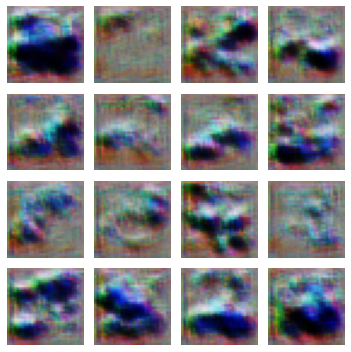

500
600
700
800
900
Iteration #1000
999: [D loss: 0.317266, acc: 0.869017]  [A loss: 3.509920, acc: 0.053710]


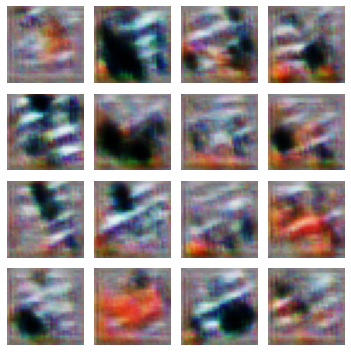

1000
1100
1200
1300
1400
Iteration #1500
1499: [D loss: 0.311870, acc: 0.870963]  [A loss: 3.687738, acc: 0.038130]


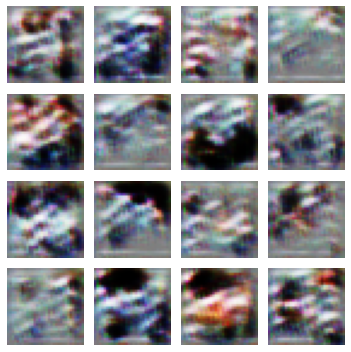

1500
1600
1700
1800
1900
Iteration #2000
1999: [D loss: 0.313590, acc: 0.869996]  [A loss: 3.643149, acc: 0.032508]


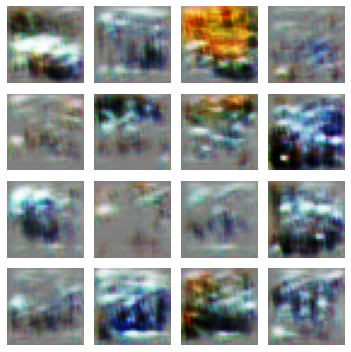

2000
2100
2200
2300
2400
Iteration #2500
2499: [D loss: 0.309827, acc: 0.871325]  [A loss: 3.670476, acc: 0.030603]


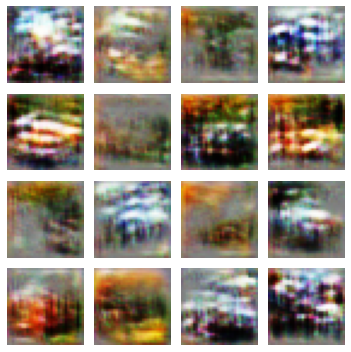

2500
2600
2700
2800
2900
Iteration #3000
2999: [D loss: 0.316472, acc: 0.867598]  [A loss: 3.567139, acc: 0.029476]


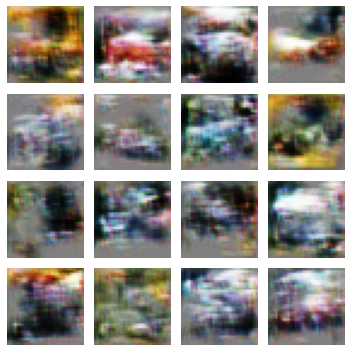

3000
3100
3200
3300
3400
Iteration #3500
3499: [D loss: 0.318847, acc: 0.866042]  [A loss: 3.498710, acc: 0.028024]


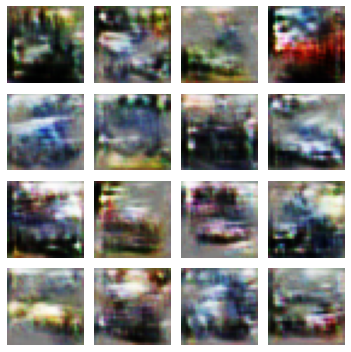

3500
3600
3700
3800
3900
Iteration #4000
3999: [D loss: 0.319631, acc: 0.865331]  [A loss: 3.424540, acc: 0.027405]


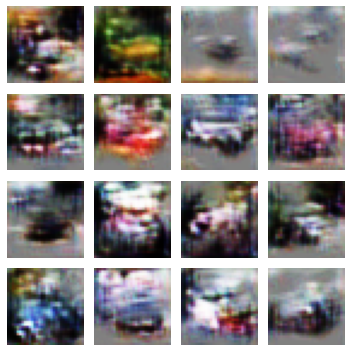

4000
4100
4200
4300
4400
Iteration #4500
4499: [D loss: 0.322213, acc: 0.863843]  [A loss: 3.346628, acc: 0.027298]


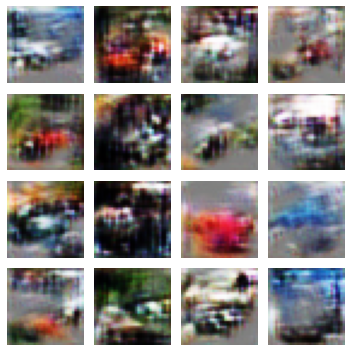

4500
4600
4700
4800
4900
Iteration #5000
4999: [D loss: 0.324257, acc: 0.862542]  [A loss: 3.299036, acc: 0.026918]


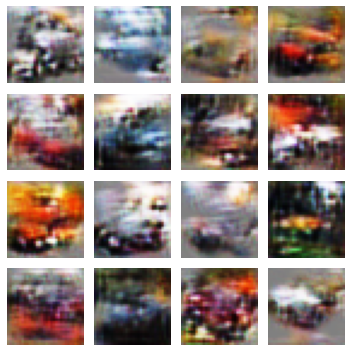

5000
5100
5200
5300
5400
Iteration #5500
5499: [D loss: 0.327143, acc: 0.860809]  [A loss: 3.241375, acc: 0.027067]


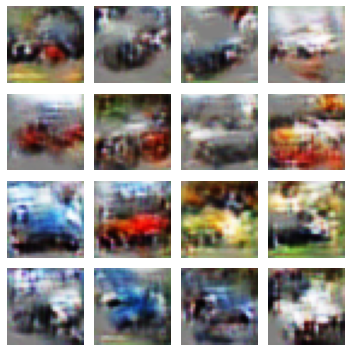

5500
5600
5700
5800
5900
Iteration #6000
5999: [D loss: 0.329282, acc: 0.859546]  [A loss: 3.195434, acc: 0.027374]


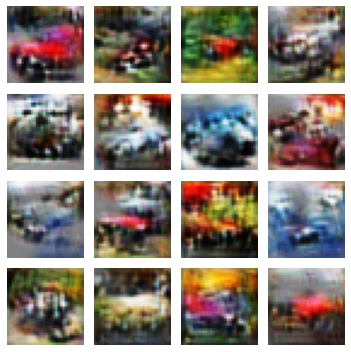

6000
6100
6200
6300
6400
Iteration #6500
6499: [D loss: 0.332435, acc: 0.857712]  [A loss: 3.156366, acc: 0.027415]


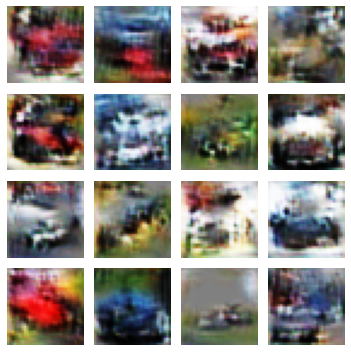

6500
6600
6700
6800
6900
Iteration #7000
6999: [D loss: 0.335882, acc: 0.855723]  [A loss: 3.119267, acc: 0.027660]


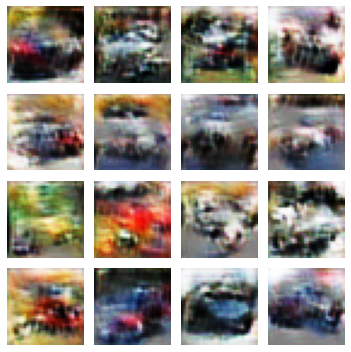

7000
7100
7200
7300
7400
Iteration #7500
7499: [D loss: 0.339441, acc: 0.853680]  [A loss: 3.084802, acc: 0.028017]


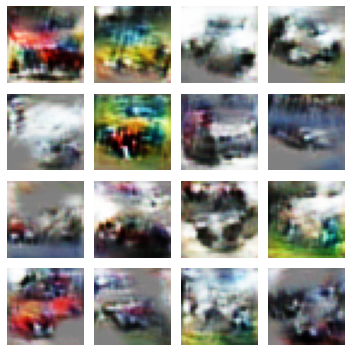

7500
7600
7700
7800
7900
Iteration #8000
7999: [D loss: 0.343252, acc: 0.851501]  [A loss: 3.052158, acc: 0.028322]


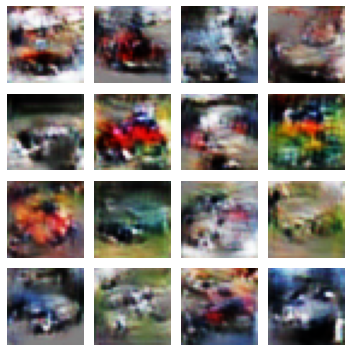

8000
8100
8200
8300
8400
Iteration #8500
8499: [D loss: 0.347285, acc: 0.849156]  [A loss: 3.018030, acc: 0.029144]


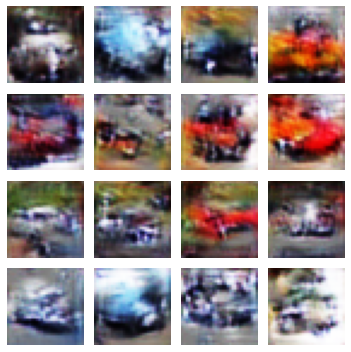

8500
8600
8700
8800
8900
Iteration #9000
8999: [D loss: 0.351217, acc: 0.846838]  [A loss: 2.984113, acc: 0.030064]


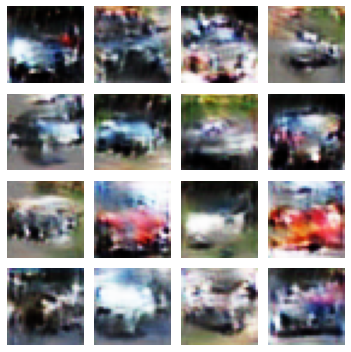

9000
9100
9200
9300
9400
Iteration #9500
9499: [D loss: 0.355259, acc: 0.844573]  [A loss: 2.951937, acc: 0.031042]


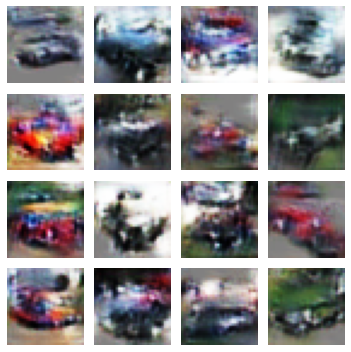

9500
9600
9700
9800
9900
Iteration #10000
9999: [D loss: 0.359134, acc: 0.842354]  [A loss: 2.923676, acc: 0.031641]


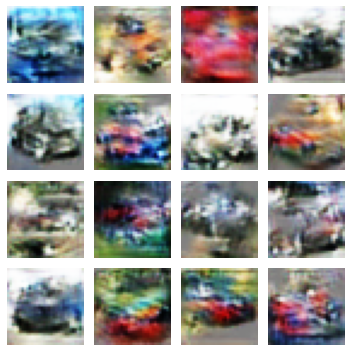

In [15]:
a_metrics_complete, d_metrics_complete = train(adversarial_model,train_images, epochs=10000)

0
100
200
300
400
Iteration #500
499: [D loss: 0.459390, acc: 0.785462]  [A loss: 2.156564, acc: 0.051650]


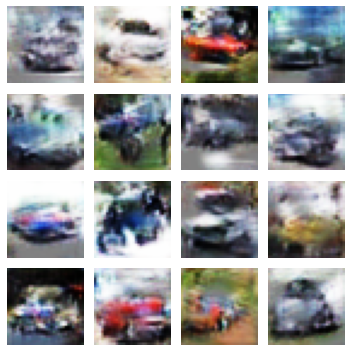

500
600
700
800
900
Iteration #1000
999: [D loss: 0.460625, acc: 0.782810]  [A loss: 2.138227, acc: 0.057127]


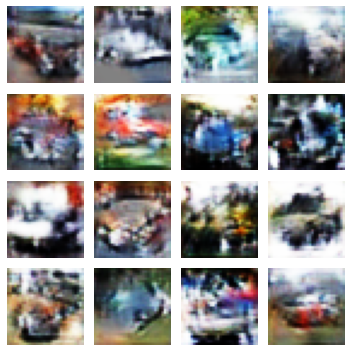

1000
1100
1200
1300
1400
Iteration #1500
1499: [D loss: 0.467786, acc: 0.777339]  [A loss: 2.101419, acc: 0.057987]


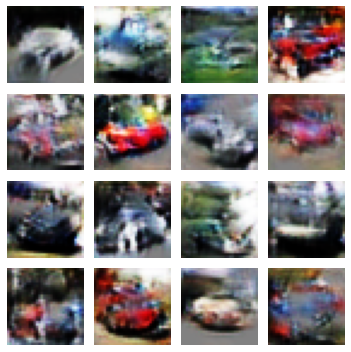

1500
1600
1700
1800
1900
Iteration #2000
1999: [D loss: 0.473626, acc: 0.772765]  [A loss: 2.062335, acc: 0.061187]


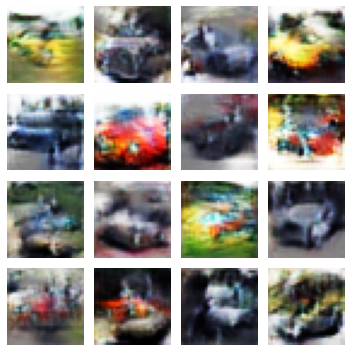

2000
2100
2200
2300
2400
Iteration #2500
2499: [D loss: 0.482180, acc: 0.766533]  [A loss: 1.997846, acc: 0.067464]


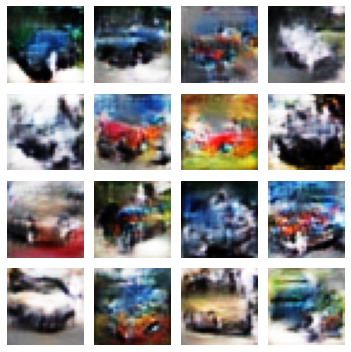

2500
2600
2700
2800
2900
Iteration #3000
2999: [D loss: 0.487137, acc: 0.762901]  [A loss: 1.968284, acc: 0.068338]


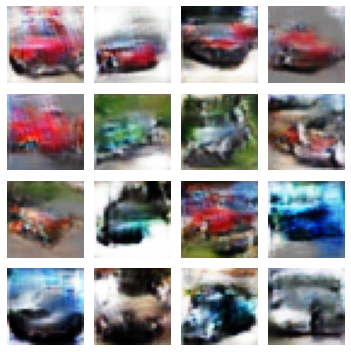

3000
3100
3200
3300
3400
Iteration #3500
3499: [D loss: 0.491713, acc: 0.759461]  [A loss: 1.929175, acc: 0.072554]


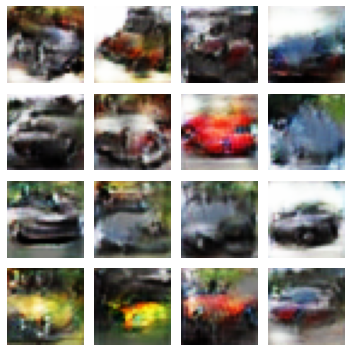

3500
3600
3700
3800
3900
Iteration #4000
3999: [D loss: 0.495236, acc: 0.756985]  [A loss: 1.909435, acc: 0.073704]


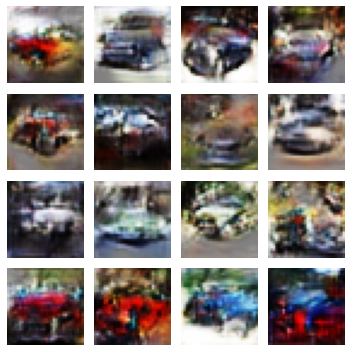

4000
4100
4200
4300
4400
Iteration #4500
4499: [D loss: 0.499542, acc: 0.753961]  [A loss: 1.878936, acc: 0.076033]


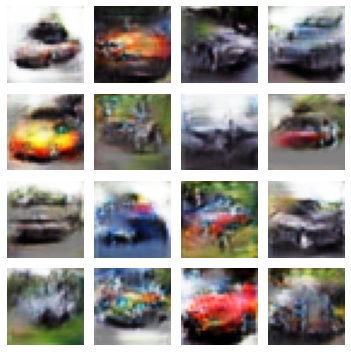

4500
4600
4700
4800
4900
Iteration #5000
4999: [D loss: 0.502925, acc: 0.751590]  [A loss: 1.848817, acc: 0.079156]


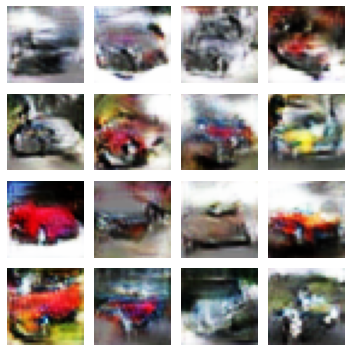

5000
5100
5200
5300
5400
Iteration #5500
5499: [D loss: 0.505736, acc: 0.749652]  [A loss: 1.821545, acc: 0.082518]


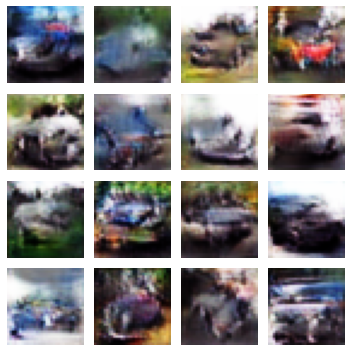

5500
5600
5700
5800
5900
Iteration #6000
5999: [D loss: 0.508656, acc: 0.747619]  [A loss: 1.798779, acc: 0.083892]


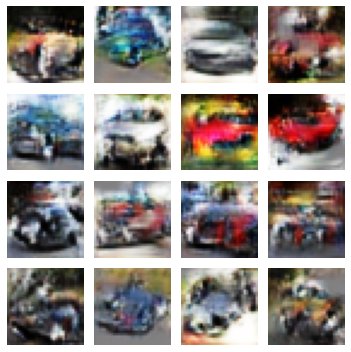

6000
6100
6200
6300
6400
Iteration #6500
6499: [D loss: 0.510947, acc: 0.745948]  [A loss: 1.779371, acc: 0.085689]


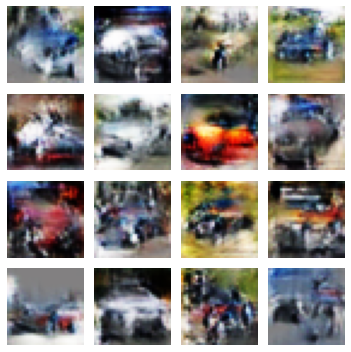

6500
6600
6700
6800
6900
Iteration #7000
6999: [D loss: 0.514726, acc: 0.743000]  [A loss: 1.753444, acc: 0.088937]


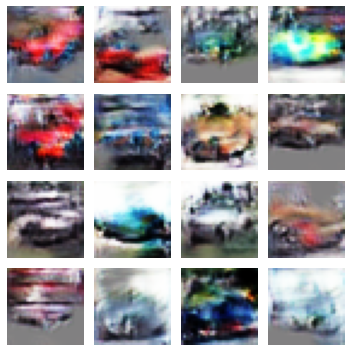

7000
7100
7200
7300
7400
Iteration #7500
7499: [D loss: 0.518417, acc: 0.740195]  [A loss: 1.730080, acc: 0.091636]


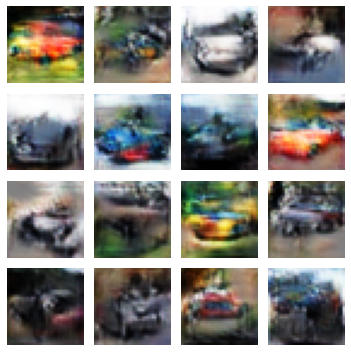

7500
7600
7700
7800
7900
Iteration #8000
7999: [D loss: 0.523838, acc: 0.735447]  [A loss: 1.696651, acc: 0.100976]


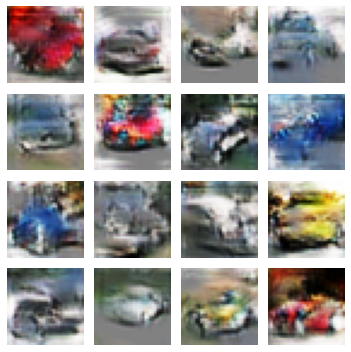

8000
8100
8200
8300
8400
Iteration #8500
8499: [D loss: 0.530133, acc: 0.729936]  [A loss: 1.654455, acc: 0.112861]


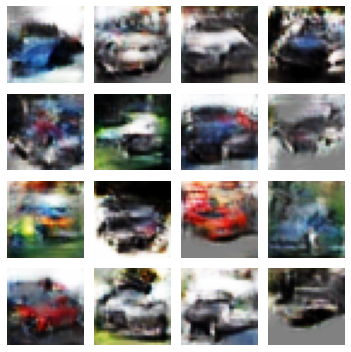

8500
8600
8700
8800
8900
Iteration #9000
8999: [D loss: 0.535156, acc: 0.725736]  [A loss: 1.620026, acc: 0.120847]


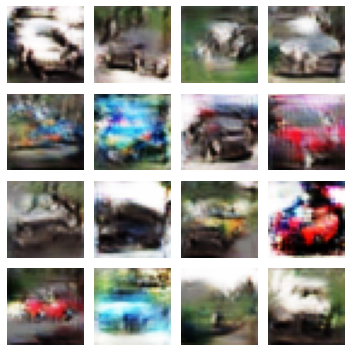

9000
9100
9200
9300
9400
Iteration #9500
9499: [D loss: 0.539078, acc: 0.722535]  [A loss: 1.593939, acc: 0.125660]


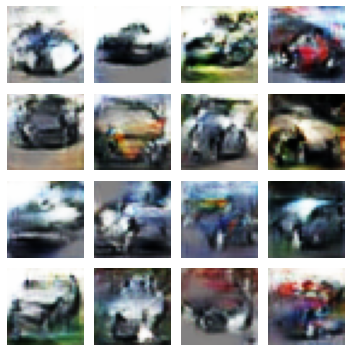

9500
9600
9700
9800
9900
Iteration #10000
9999: [D loss: 0.542253, acc: 0.720023]  [A loss: 1.571362, acc: 0.129496]


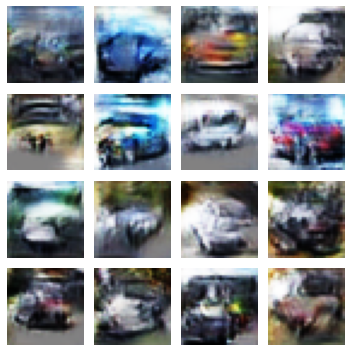

In [17]:
a_metrics_complete, d_metrics_complete = train(adversarial_model,train_images, epochs=10000)